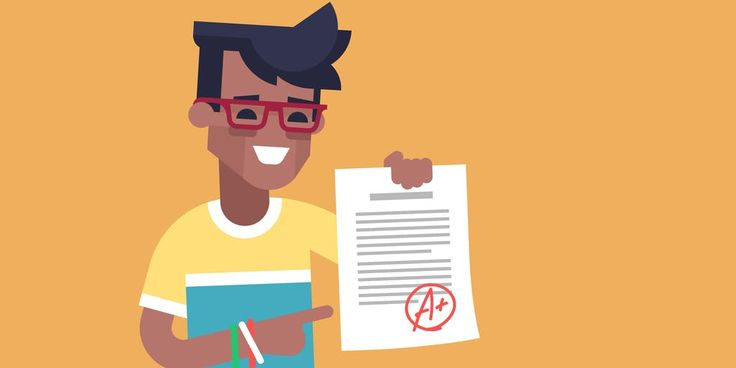

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/students-grading-dataset/Students_Grading_Dataset.csv
/kaggle/input/students-grading-dataset/metadata.xlsx
/kaggle/input/students-grading-dataset/Students_Grading_Dataset.json


<h1 style="border-top: 2px solid purple; border-bottom: 2px solid purple; padding: 8px; text-align: center;">
    Import Libraries
</h1>


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# interactive visualization
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from scipy import stats 
# hide warnings
import warnings
warnings.filterwarnings('ignore')

<h1 style="border-top: 3px solid purple; border-bottom: 3px solid purple; padding: 5px; text-align: center;">
    Explore Data
</h1>


In [3]:
data=pd.read_csv('/kaggle/input/students-grading-dataset/Students_Grading_Dataset.csv')
data.head(7)

,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1
5,S1005,Liam,Brown,student5@university.com,Male,21,Engineering,NaN,78.85,43.53,...,67.29,62.08,B,8.5,Yes,Yes,PhD,High,1,5.0
6,S1006,Ahmed,Jones,student6@university.com,Male,24,Business,57.60,66.26,89.07,...,93.65,83.21,F,21.3,No,Yes,NaN,Low,5,6.4


In [4]:
data.shape

(5000, 23)

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  5000 non-null   object 
 1   First_Name                  5000 non-null   object 
 2   Last_Name                   5000 non-null   object 
 3   Email                       5000 non-null   object 
 4   Gender                      5000 non-null   object 
 5   Age                         5000 non-null   int64  
 6   Department                  5000 non-null   object 
 7   Attendance (%)              4484 non-null   float64
 8   Midterm_Score               5000 non-null   float64
 9   Final_Score                 5000 non-null   float64
 10  Assignments_Avg             4483 non-null   float64
 11  Quizzes_Avg                 5000 non-null   float64
 12  Participation_Score         5000 non-null   float64
 13  Projects_Score              5000 

In [6]:
data.isna().sum()*100/len(data)

Student_ID                     0.00
First_Name                     0.00
Last_Name                      0.00
Email                          0.00
Gender                         0.00
Age                            0.00
Department                     0.00
Attendance (%)                10.32
Midterm_Score                  0.00
Final_Score                    0.00
Assignments_Avg               10.34
Quizzes_Avg                    0.00
Participation_Score            0.00
Projects_Score                 0.00
Total_Score                    0.00
Grade                          0.00
Study_Hours_per_Week           0.00
Extracurricular_Activities     0.00
Internet_Access_at_Home        0.00
Parent_Education_Level        35.88
Family_Income_Level            0.00
Stress_Level (1-10)            0.00
Sleep_Hours_per_Night          0.00
dtype: float64

In [7]:
data.describe()

,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Total_Score,Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night
count,5000.000000,4484.000000,5000.000000,5000.000000,4483.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,21.048400,75.431409,70.326844,69.640788,74.798673,74.910728,4.980024,74.924860,75.121804,17.658860,5.48080,6.488140
std,1.989786,14.372446,17.213209,17.238744,14.411799,14.504281,2.890136,14.423415,14.399941,7.275864,2.86155,1.452283
min,18.000000,50.010000,40.000000,40.000000,50.000000,50.030000,0.000000,50.010000,50.020000,5.000000,1.00000,4.000000
25%,19.000000,63.265000,55.457500,54.667500,62.090000,62.490000,2.440000,62.320000,62.835000,11.400000,3.00000,5.200000
50%,21.000000,75.725000,70.510000,69.735000,74.810000,74.695000,4.955000,74.980000,75.395000,17.500000,5.00000,6.500000
75%,23.000000,87.472500,84.970000,84.500000,86.970000,87.630000,7.500000,87.367500,87.652500,24.100000,8.00000,7.700000
max,24.000000,100.000000,99.980000,99.980000,99.980000,99.960000,10.000000,100.000000,99.990000,30.000000,10.00000,9.000000


In [8]:
data.describe(include='object')

,Student_ID,First_Name,Last_Name,Email,Gender,Department,Grade,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level
count,5000,5000,5000,5000,5000,5000,5000,5000,5000,3206,5000
unique,5000,8,6,5000,2,4,5,2,2,4,3
top,S1000,Maria,Johnson,student0@university.com,Male,CS,A,No,Yes,PhD,Low
freq,1,657,868,1,2551,2022,1495,3493,4485,820,1983


In [9]:
data.duplicated().sum()

0

<h1 style="border-top: 3px solid purple; border-bottom: 3px solid purple; padding: 5px; text-align: center;">
    Data Cleaning
</h1>


In [10]:
data.columns

Index(['Student_ID', 'First_Name', 'Last_Name', 'Email', 'Gender', 'Age',
       'Department', 'Attendance (%)', 'Midterm_Score', 'Final_Score',
       'Assignments_Avg', 'Quizzes_Avg', 'Participation_Score',
       'Projects_Score', 'Total_Score', 'Grade', 'Study_Hours_per_Week',
       'Extracurricular_Activities', 'Internet_Access_at_Home',
       'Parent_Education_Level', 'Family_Income_Level', 'Stress_Level (1-10)',
       'Sleep_Hours_per_Night'],
      dtype='object')

Assignments_Avg & Attendance (%) are normaly distributed and have no outliers so we can fill nulls of Assignments_Avg & Attendance (%) with mean

In [11]:
data['Assignments_Avg'].fillna(data['Assignments_Avg'].mean(),inplace=True)
data['Attendance (%)'].fillna(data['Attendance (%)'].mean(),inplace=True)
data['Parent_Education_Level'].fillna(data['Parent_Education_Level'].mode()[0],inplace=True)

<h1 style="border-top: 2px solid purple; border-bottom: 2px solid purple; padding: 8px; text-align: center;">
    EDA
</h1>

In [12]:
# for offline ploting
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

In [13]:
import plotly.io as pio
pio.renderers.default = 'colab'

In [14]:
colors = ['#49243E', '#E3A5C7','#704264', '#BB8493', '#DBAFA0','#694F8E','#F4CCE9','#D17D98','#56021F','#7D1C4A']

## Gender Distribution

In [15]:
import plotly.io as pio
pio.renderers.default = "notebook"

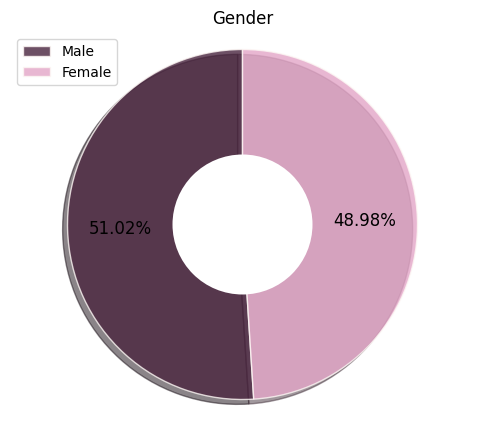

In [16]:
plt.figure(figsize=(6, 5))
plt.pie(data['Gender'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Gender')
plt.legend(data['Gender'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Distribution of grades among students

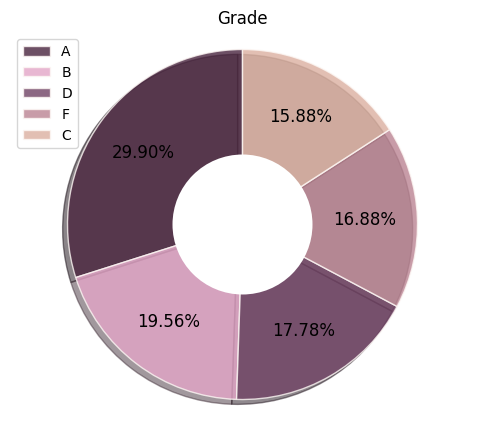

In [17]:
plt.figure(figsize=(6, 5))
plt.pie(data['Grade'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Grade')
plt.legend(data['Grade'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Department Distribution

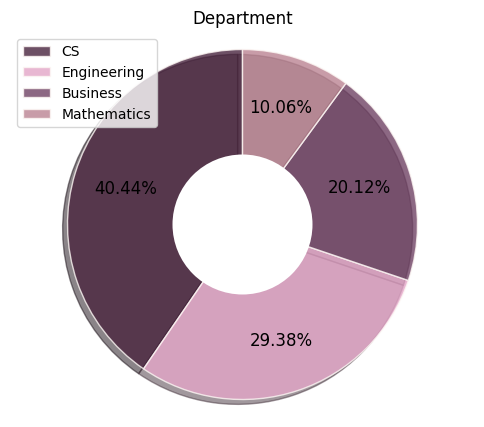

In [18]:
plt.figure(figsize=(6, 5))
plt.pie(data['Department'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Department')
plt.legend(data['Department'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Internet_Access_at_Home Distribution

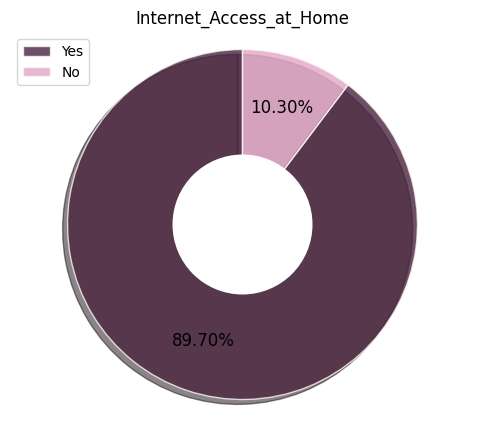

In [19]:
plt.figure(figsize=(6, 5))
plt.pie(data['Internet_Access_at_Home'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Internet_Access_at_Home')
plt.legend(data['Internet_Access_at_Home'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Family_Income_Level Distribution

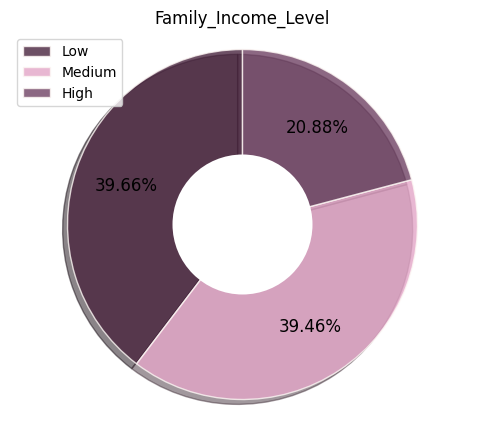

In [20]:
plt.figure(figsize=(6, 5))
plt.pie(data['Family_Income_Level'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Family_Income_Level')
plt.legend(data['Family_Income_Level'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Stress Distribution

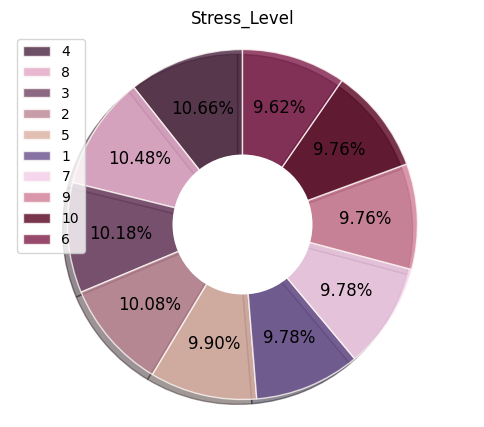

In [21]:
plt.figure(figsize=(6, 5))
plt.pie(data['Stress_Level (1-10)'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Stress_Level')
plt.legend(data['Stress_Level (1-10)'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Parent_Education_Level Distribution

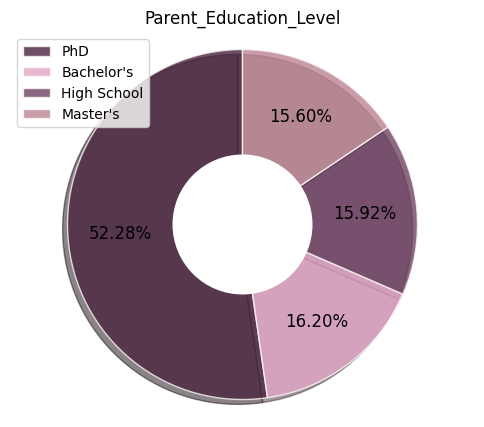

In [22]:
plt.figure(figsize=(6, 5))
plt.pie(data['Parent_Education_Level'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Parent_Education_Level')
plt.legend(data['Parent_Education_Level'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Extracurricular_Activities Distribution

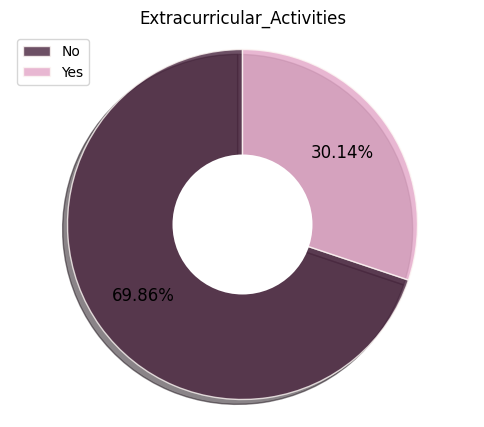

In [23]:
plt.figure(figsize=(6, 5))
plt.pie(data['Extracurricular_Activities'].value_counts(), startangle=90,shadow=True,pctdistance=0.7,autopct='%.2f%%', wedgeprops=dict(alpha=0.8, edgecolor='#FDF7F4'),textprops={'fontsize':12},colors=colors)
centre_circle = plt.Circle((0,0), 0.40, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.axis('equal')
plt.title('Extracurricular_Activities')
plt.legend(data['Extracurricular_Activities'].value_counts().index.tolist(),loc='upper left')
plt.show()

## Quizzes_avg distribution

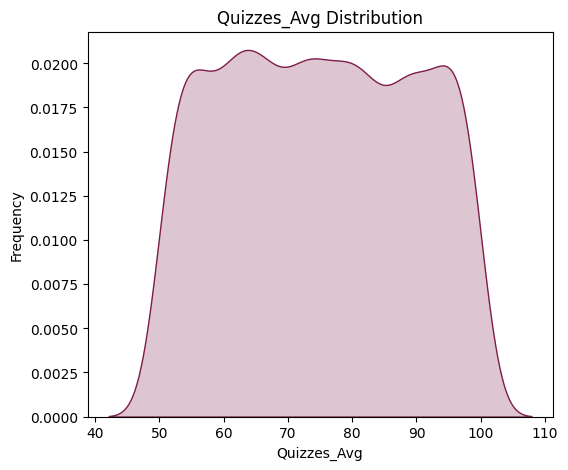

In [24]:
plt.figure(figsize=(6, 5))
sns.kdeplot(data=data, x='Quizzes_Avg', fill=True,color=colors[9])
plt.title('Quizzes_Avg Distribution')
plt.xlabel('Quizzes_Avg')
plt.ylabel('Frequency')
plt.show()

## Final score distribution

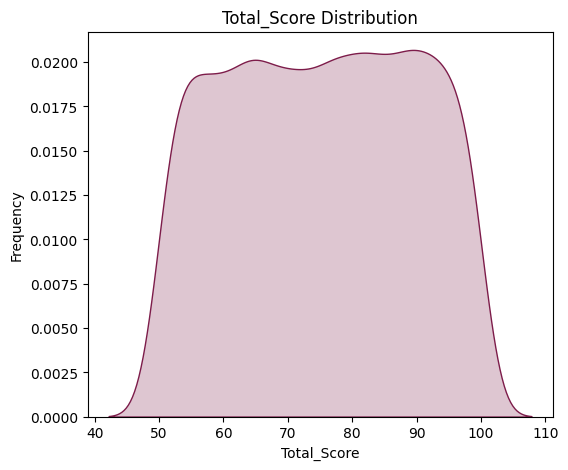

In [25]:
plt.figure(figsize=(6, 5))
sns.kdeplot(data=data, x='Total_Score', fill=True,color=colors[9])
plt.title('Total_Score Distribution')
plt.xlabel('Total_Score')
plt.ylabel('Frequency')
plt.show()

## Total score distribution

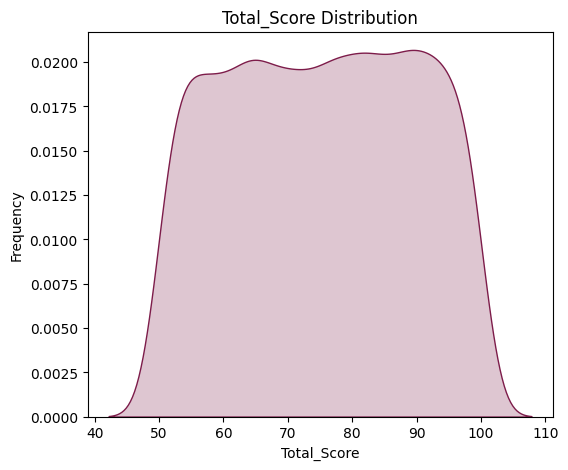

In [26]:
plt.figure(figsize=(6, 5))
sns.kdeplot(data=data, x='Total_Score', fill=True,color=colors[9])
plt.title('Total_Score Distribution')
plt.xlabel('Total_Score')
plt.ylabel('Frequency')
plt.show()

## Age Distribution

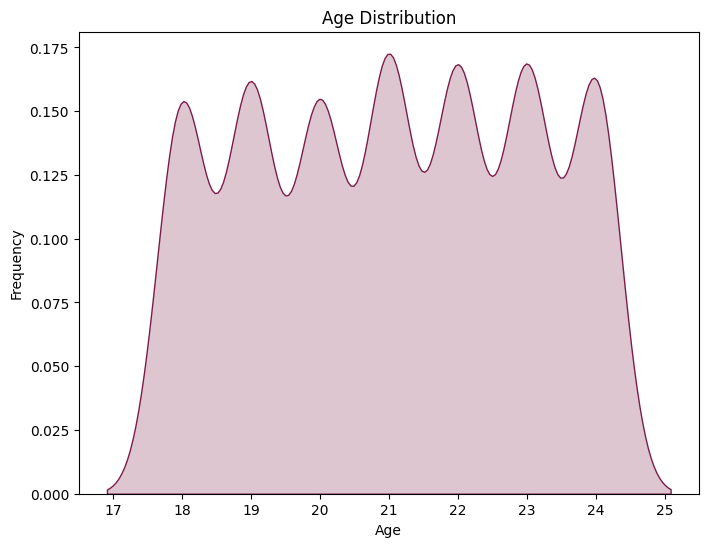

In [27]:
plt.figure(figsize=(8, 6))
sns.kdeplot(data=data, x='Age', fill=True,color=colors[9])
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

## Assignments_Avg distribution

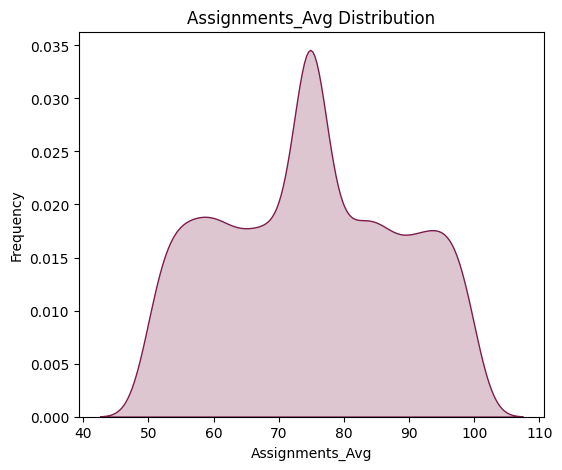

In [28]:
plt.figure(figsize=(6, 5))
sns.kdeplot(data=data, x='Assignments_Avg', fill=True,color=colors[9])
plt.title('Assignments_Avg Distribution')
plt.xlabel('Assignments_Avg')
plt.ylabel('Frequency')
plt.show()

## Midterm_Score distribution

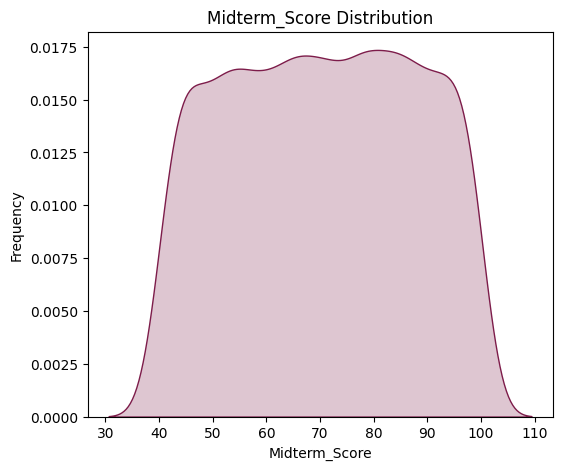

In [29]:
plt.figure(figsize=(6, 5))
sns.kdeplot(data=data, x='Midterm_Score', fill=True,color=colors[9])
plt.title('Midterm_Score Distribution')
plt.xlabel('Midterm_Score')
plt.ylabel('Frequency')
plt.show()

## Check how different scores (Midterm, Final, Assignments, Quizzes, Projects) correlate with the Total Score.

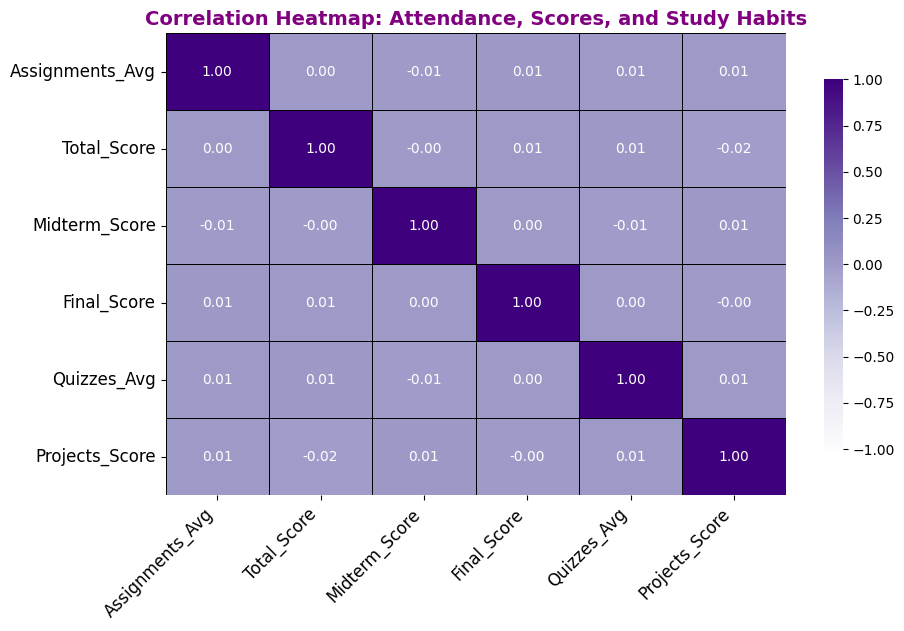

In [30]:
correlation_columns = ["Assignments_Avg", "Total_Score", "Midterm_Score", "Final_Score", "Quizzes_Avg","Projects_Score"]

corr_matrix = data[correlation_columns].corr()

plt.figure(figsize=(10, 6))

sns.heatmap(corr_matrix, 
            annot=True,              
            cmap="Purples",          
            fmt=".2f",               
            linewidths=0.5,          
            linecolor="black",      
            vmin=-1, vmax=1,        
            cbar_kws={'shrink': 0.8}) 

plt.title("Correlation Heatmap: Attendance, Scores, and Study Habits", fontsize=14, fontweight='bold', color='purple')
plt.xticks(rotation=45, ha="right", fontsize=12, color='black')
plt.yticks(fontsize=12, color='black')

plt.show()

## Gender vs. Performance

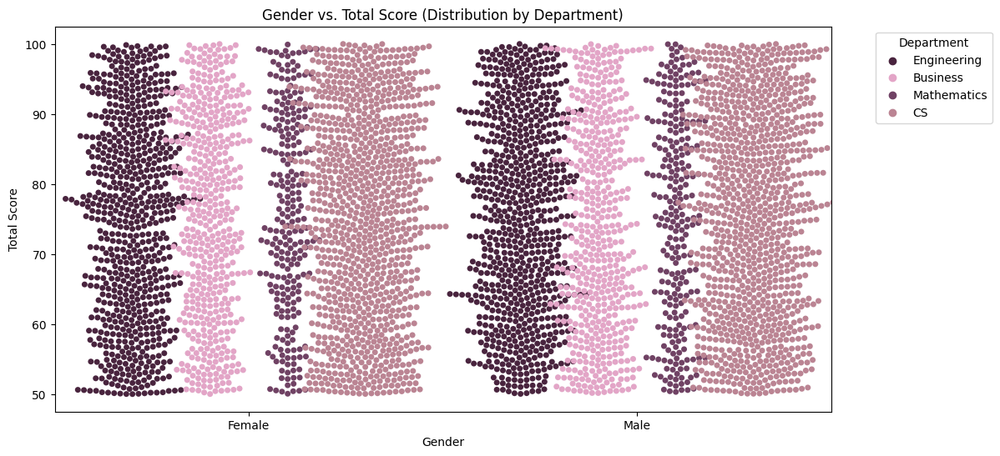

In [31]:
plt.figure(figsize=(12, 6))
sns.swarmplot(data=data, x='Gender', y='Total_Score', hue='Department', palette=colors, dodge=True,linewidth=0.01)
plt.title('Gender vs. Total Score (Distribution by Department)')
plt.xlabel('Gender')
plt.ylabel('Total Score')
plt.legend(title='Department', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

📌 Both males and females exhibit a similar distribution of total scores across departments.<br>
📌 The distribution does not appear skewed towards very high or very low scores for any department or gender, indicating a fairly balanced performance trend.

## Compare the distribution of grades by gender.

In [32]:
gender_grade = pd.crosstab(data['Gender'], data['Grade'])

gender_grade_long = gender_grade.reset_index().melt(id_vars='Gender', var_name='Grade', value_name='Count')

fig = px.bar(gender_grade_long,
             x='Gender',
             y='Count',
             color='Grade',
             title='Grade Distribution by Gender',
             labels={'Count': 'Number of Students', 'Gender': 'Gender'},
             barmode='stack',
             color_discrete_sequence=px.colors.sequential.RdPu_r)

fig.update_layout(legend_title_text='Grade')
fig.show()

## Does Parent Education Level & Family Income influence student scores?

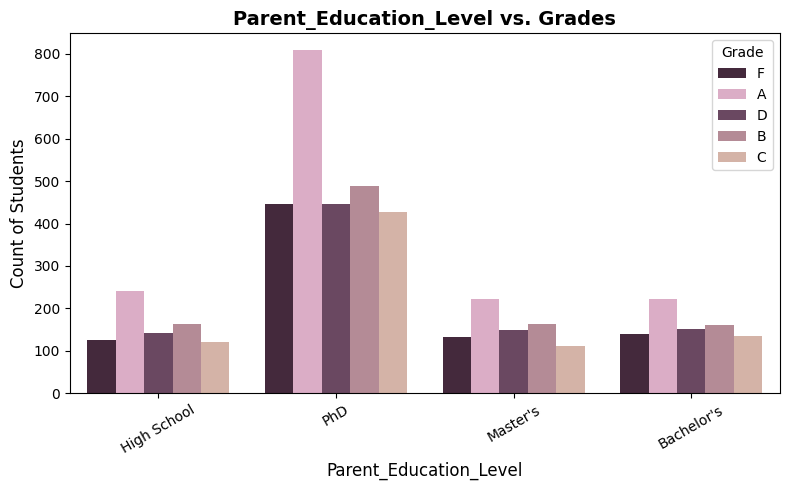

In [33]:
plt.figure(figsize=(8, 5))

sns.countplot(x="Parent_Education_Level", hue="Grade", data=data, palette=colors)

plt.title("Parent_Education_Level vs. Grades", fontsize=14, fontweight="bold")
plt.xlabel("Parent_Education_Level", fontsize=12)
plt.ylabel("Count of Students", fontsize=12)

plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

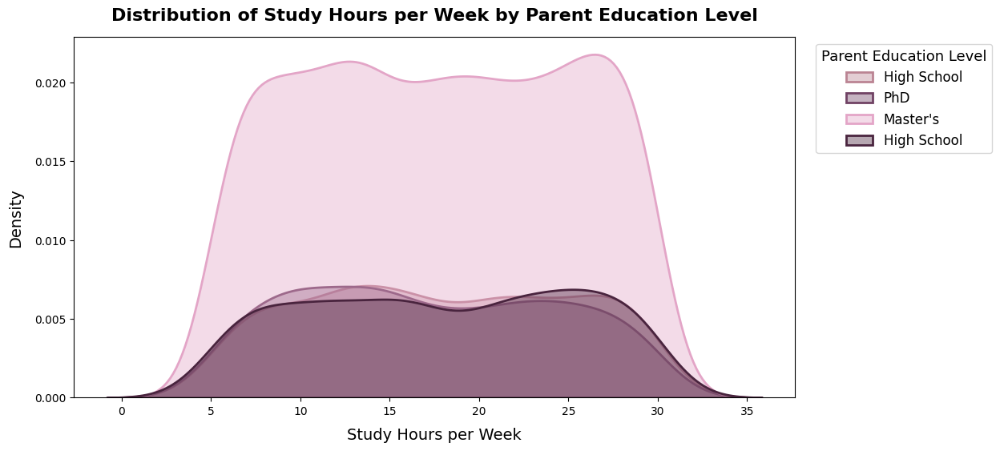

In [34]:
plt.figure(figsize=(12, 6))  # Wider figure for better spacing

# KDE Plot
sns.kdeplot(data=data, x="Study_Hours_per_Week", hue="Parent_Education_Level",
            fill=True, alpha=0.4, linewidth=2, palette=colors)

# Customize Labels and Title
plt.title("Distribution of Study Hours per Week by Parent Education Level", fontsize=16, fontweight='bold', pad=15)
plt.xlabel("Study Hours per Week", fontsize=14, labelpad=10)
plt.ylabel("Density", fontsize=14, labelpad=10)

# Improve Legend Placement
plt.legend(title="Parent Education Level",labels=data['Parent_Education_Level'].values ,bbox_to_anchor=(1.02, 1), loc="upper left",
           fontsize=12, title_fontsize=13, frameon=True)

# Explicitly Adjust Layout
plt.subplots_adjust(left=0.1, right=0.85, top=0.9, bottom=0.15)  # Prevents labels from being cut off

# Show Plot
plt.show()


📌Students might rely more on self-study, peer groups, or online resources, making parental education less impactful.

## How do Study_Hours_per_Week, Sleep_Hours_per_Night, and Stress_Level influence grades?

In [35]:
fig = px.scatter(data, x='Study_Hours_per_Week', y='Total_Score', color='Grade',
                 title="Study Hours vs. Total Score", trendline="ols")
fig.show()

### Are high-stress students studying more but still scoring low?

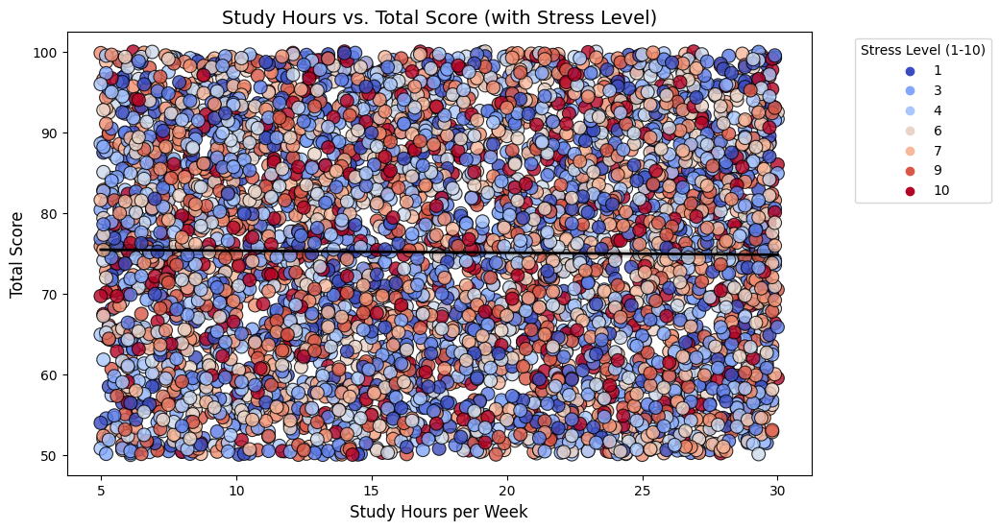

In [36]:
plt.figure(figsize=(10, 6))

scatter = sns.scatterplot(data=data, x="Study_Hours_per_Week", y="Total_Score",
                          hue="Stress_Level (1-10)", palette="coolwarm", s=100, alpha=0.8, edgecolor="black")

# Add Regression Line (without scatter points)
sns.regplot(data=data, x="Study_Hours_per_Week", y="Total_Score", scatter=False, color="black", line_kws={"linewidth": 2})

# Labels & Titles
plt.title("Study Hours vs. Total Score (with Stress Level)", fontsize=14)
plt.xlabel("Study Hours per Week", fontsize=12)
plt.ylabel("Total Score", fontsize=12)

# Move Legend Outside
plt.legend(title="Stress Level (1-10)", bbox_to_anchor=(1.05, 1), loc="upper left")

# Show Plot
plt.show()

📌I think students may need better study techniques because study hours increase but performance remains unchanged

## Do students with high Attendance (%) and Participation_Score perform better?

In [37]:
fig = px.scatter(data, x="Attendance (%)", y="Total_Score", color="Grade",
                 title="Attendance vs. Total Score", trendline="ols")
fig.show()


In [38]:
import plotly.express as px

# Create the Box Plot
fig = px.box(data, x="Grade", y="Attendance (%)",
             color="Grade",
             title="Attendance % Distribution Across Grades",
             labels={"Grade": "Grade", "Attendance (%)": "Attendance Percentage"},
             template="plotly_white")

# Show the interactive plot
fig.show()


📌 attendance impacts performance<br>
📌 Students with higher grades (A, B) tend to have higher attendance percentages.<br>
📌 Students with lower grades (D, F) show lower attendance rates<br>

## Are students with No Internet Access more likely to underperform?

In [39]:
internet_access = pd.crosstab(data['Internet_Access_at_Home'], data['Grade'])

fig = px.bar(internet_access, x=internet_access.index, y=internet_access.columns,
             title="Internet Access at Home vs. Grade", barmode='stack',
             color_discrete_sequence=px.colors.sequential.RdPu_r)  # Use sequential purple colors

fig.update_layout(
    xaxis_title="Internet Access at Home",
    yaxis_title="Count",
    legend_title_text="Grade",
    legend_traceorder="reversed"
)

fig.show()


## Are students with high Stress Levels more likely to underperform?

In [40]:
stress_avg_score = data.groupby("Stress_Level (1-10)")["Total_Score"].mean().reset_index()

fig = px.bar(stress_avg_score, x="Stress_Level (1-10)", y="Total_Score",
             title="Total Score vs. Stress Level", color="Total_Score",
             color_continuous_scale="purples")
fig.show()


📌Stress don't have empact on students' grades thats good

## Do Extracurricular Activities Improve Academic Performance

**Students who participate in extracurricular activities might have higher grades due to better time management, engagement, and discipline.**

In [41]:
activity_grade_gender = data.groupby(["Extracurricular_Activities", "Gender", "Grade"]).size().reset_index(name="Count")

fig = px.bar(activity_grade_gender,
             x="Extracurricular_Activities",
             y="Count",
             color="Grade",
             facet_col="Gender",
             title="Impact of Extracurricular Activities on Grades by Gender",
             labels={"Extracurricular_Activities": "Participation in Extracurricular Activities", "Count": "Number of Students"},
             barmode="stack",
             color_discrete_sequence=px.colors.sequential.RdPu_r)

fig.update_layout(legend_title_text="Grade", template="plotly_white")
fig.show()


📌Only a small group of students participate extracurriculars

In [42]:
fig = px.box(data,
             x="Extracurricular_Activities",
             y="Total_Score",
             color="Gender",
             title="Effect of Extracurricular Activities on Total Score by Gender",
             labels={"Extracurricular_Activities": "Extracurricular Participation",
                     "Total_Score": "Total Score"},
             template="plotly_white")
fig.update_layout(legend_title_text="Gender")

fig.show()


📌extracurriculars doesn't have impact on student performance


## Sleep Hours & Study Hours are Spread Across Different Grades

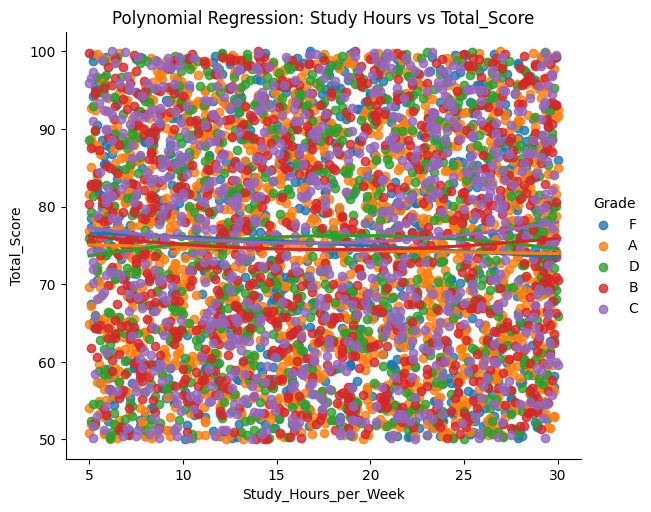

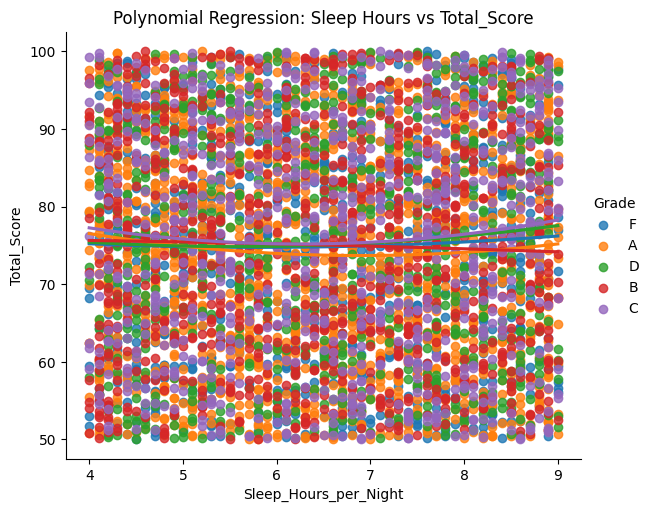

In [43]:
data["Study_Hours_Squared"] = np.square(data["Study_Hours_per_Week"])

sns.lmplot(data=data, x="Study_Hours_per_Week", y="Total_Score", hue="Grade",
           order=2, ci=None, height=5, aspect=1.2)
plt.title("Polynomial Regression: Study Hours vs Total_Score")

sns.lmplot(data=data, x="Sleep_Hours_per_Night", y="Total_Score", hue="Grade",
           order=2, ci=None, height=5, aspect=1.2)
plt.title("Polynomial Regression: Sleep Hours vs Total_Score")
plt.show()


📌 Sleep is not a strong predictor of total scores, as performance remains highly variable regardless of sleep duration.<br>
📌 The polynomial regression lines are nearly flat, reinforcing that more sleep does not necessarily lead to higher or lower scores.

In [44]:
data.drop('Study_Hours_Squared',axis=1,inplace=True)

## Some students may study long hours but achieve low scores due to ineffective study techniques or stress. Let's analyze study efficiency across genders.

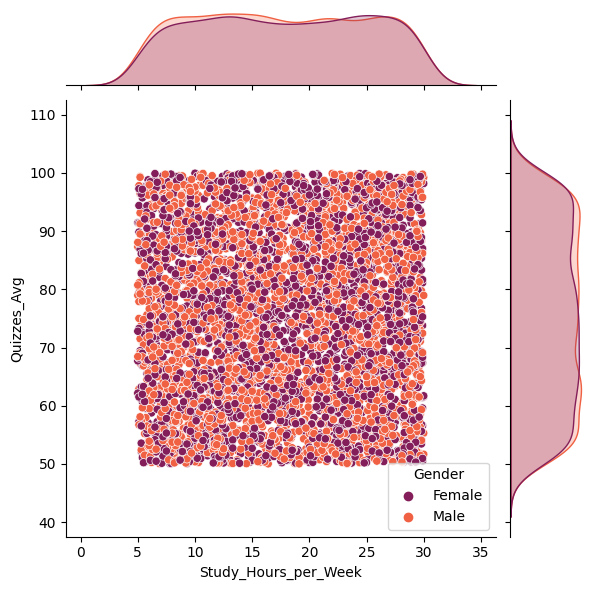

In [45]:
sns.jointplot(data=data,x='Study_Hours_per_Week',y='Quizzes_Avg',palette='rocket',hue='Gender')

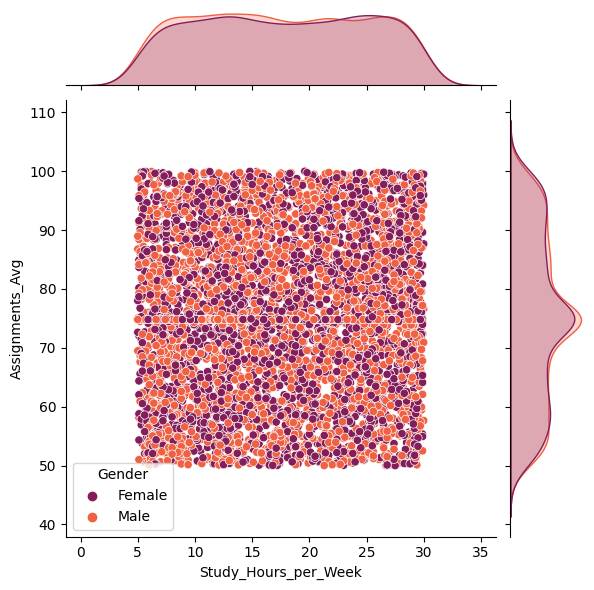

In [46]:
sns.jointplot(data=data,x='Study_Hours_per_Week',y='Assignments_Avg',palette='rocket',hue='Gender')

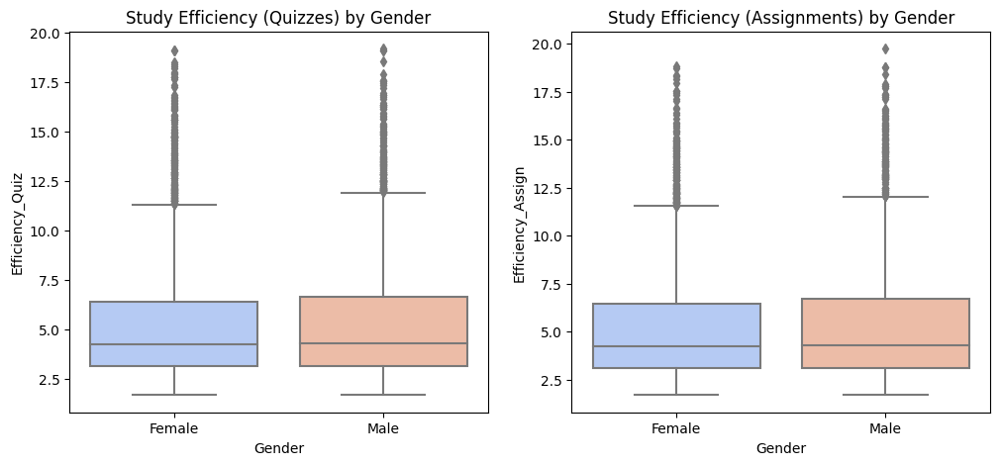

In [47]:
data["Efficiency_Quiz"] = data["Quizzes_Avg"] / data["Study_Hours_per_Week"]
data["Efficiency_Assign"] = data["Assignments_Avg"] / data["Study_Hours_per_Week"]

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
sns.boxplot(data=data, x="Gender", y="Efficiency_Quiz", ax=ax[0], palette="coolwarm")
ax[0].set_title("Study Efficiency (Quizzes) by Gender")

sns.boxplot(data=data, x="Gender", y="Efficiency_Assign", ax=ax[1], palette="coolwarm")
ax[1].set_title("Study Efficiency (Assignments) by Gender")

plt.show()


📌 More study hours do not guarantee higher quiz scores or higher Assignments Avg, as students with similar study hours have widely varying quiz averages and Assignments Avg.<br>
📌 Both genders perform similarly in terms of study habits, quiz performance and Assignments performance, with no noticeable advantage for either group.<br>
📌 The density distribution suggests a balanced dataset, meaning study behaviors and quiz results are not skewed towards one extreme.

In [48]:
fig = px.violin(
    data_frame=data,
    x="Grade",
    y="Sleep_Hours_per_Night",
    color="Gender",
    box=True,
    title="Distribution of Study Hours Across Performance Categories",
    labels={"Grade": "Grade", "Sleep_Hours_per_Night": "Sleep Hours per Night"},
    template="plotly_white",
    color_discrete_sequence=px.colors.sequential.RdPu_r
)

fig.update_layout(
    title_font=dict(size=16, family="Arial", color="black"),
    xaxis_title_font=dict(size=14),
    yaxis_title_font=dict(size=14),
    legend_title="Gender",
    legend=dict(font=dict(size=12)),
)

fig.show()


📌low scorers study long hours, this may suggest ineffective studying.

In [49]:
data.drop(['Efficiency_Quiz','Efficiency_Assign'],axis=1,inplace=True)

## Identify departments where students achieve higher grades more frequently.

In [50]:
grouped_data = data.groupby(['Department', 'Gender', 'Grade']).size().reset_index(name='Count')

fig = px.bar(grouped_data,
             x="Department",
             y="Count",
             color="Grade",
             barmode="stack",
             facet_col="Gender",
             title="Grade Distribution by Gender and Department",
             labels={"Count": "Number of Students", "Department": "Department"},
             color_discrete_sequence=px.colors.sequential.RdPu_r)

fig.update_layout(xaxis_tickangle=-45)
fig.show()


📌 there is no certain gender dominate specific grades in different departments.<br>
📌 Cs department has the highest distribution of grades.


## Impact of Stress on Study Hours & Performance

In [51]:
data["Efficiency"] = data["Total_Score"] / data["Study_Hours_per_Week"]
fig = px.bar(data,
             x="Stress_Level (1-10)",
             y="Total_Score",
             color="Gender",
             barmode="group",
             title="Study Efficiency vs. Stress Level",
             labels={"Total_Score": "Score per Study Hour"},
             color_discrete_map={"Male": "darkviolet", "Female": "fuchsia"})

fig.show()

📌 Males appear to be more efficient under low to moderate stress levels.<br>
📌 Females tend to maintain efficiency or adapt better at higher stress levels (8-10).<br>
📌 Both genders experience a decline under extreme stress (10), but not drastically.<br>

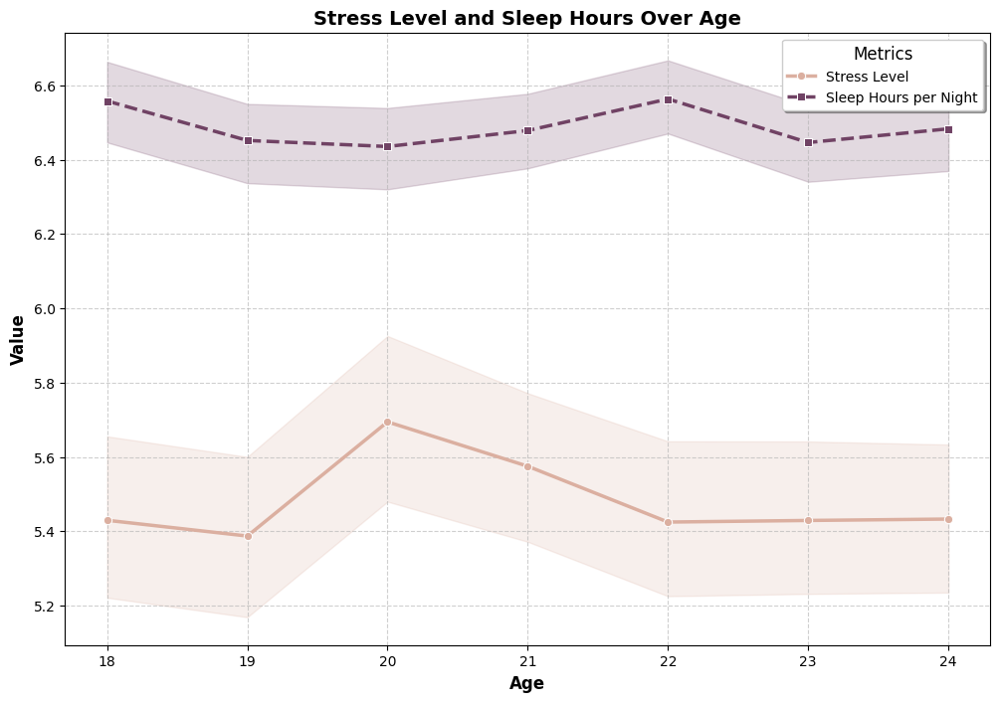

In [52]:
stress_std = np.random.uniform(0.2, 0.5, size=len(data))
sleep_std = np.random.uniform(0.2, 0.5, size=len(data))

plt.figure(figsize=(12, 8))

# Stress Level Plot
sns.lineplot(
    x=data['Age'],
    y=data['Stress_Level (1-10)'],
    label="Stress Level",
    marker='o',
    color=colors[4],
    linewidth=2.5,
    linestyle='-'
)

sns.lineplot(
    x=data['Age'],
    y=data['Sleep_Hours_per_Night'],
    label="Sleep Hours per Night",
    marker='s',
    color=colors[2],
    linewidth=2.5,
    linestyle='--'
)

# Labels and Title
plt.xlabel("Age", fontsize=12, fontweight='bold')
plt.ylabel("Value", fontsize=12, fontweight='bold')
plt.title("Stress Level and Sleep Hours Over Age", fontsize=14, fontweight='bold')

# Axis Styling
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

# Legend
plt.legend(title="Metrics", title_fontsize=12, fontsize=10, fancybox=True, shadow=True, loc='upper right')

plt.show()


📌  Stress levels peak around age 20, while sleep hours are at their lowest between ages 19-21.<br>
📌 Age 20 often corresponds to academic pressure, career planning, or increased workload, leading to higher stress levels.<br>
📌 Stress levels tend to decline after age 21, which could indicate that individuals develop better coping mechanisms or adjust to academic and career pressures.<br>

## discover outliers

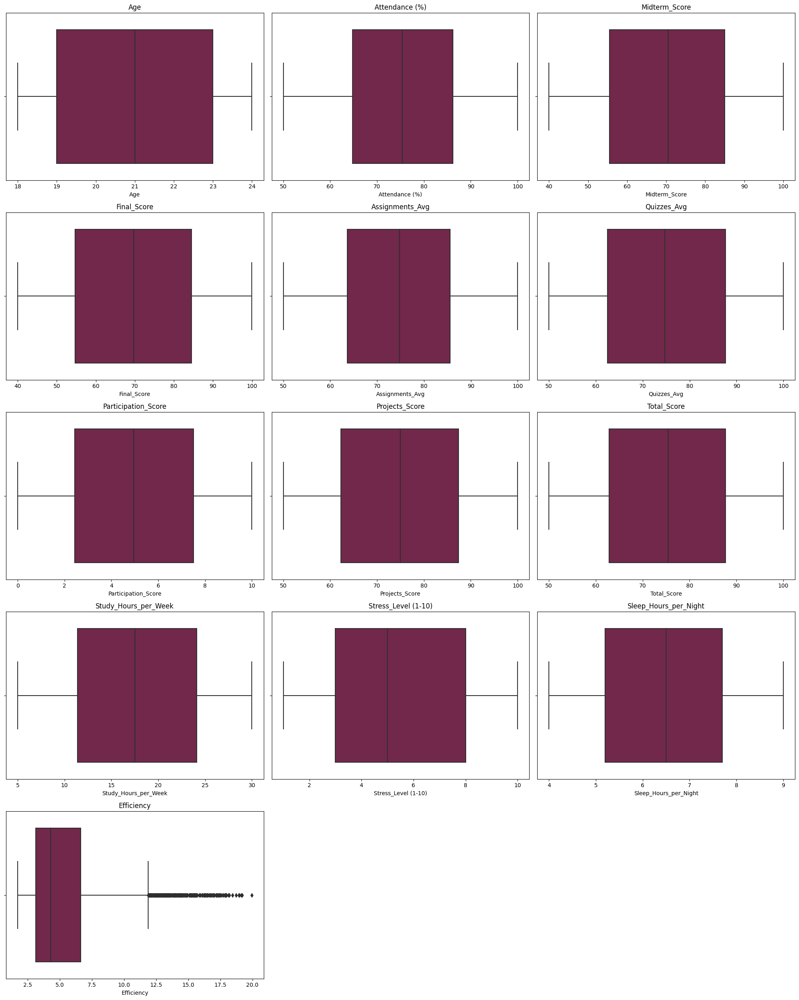

In [53]:
numeric_col = data.select_dtypes(include=np.number).columns.to_list()

num_cols = len(numeric_col)
rows = (num_cols // 3) + (num_cols % 3 > 0)

plt.figure(figsize=(20, rows * 5))

for i, col in enumerate(numeric_col):
    plt.subplot(rows, 3, i + 1)  
    sns.boxplot(x=data[col],color=colors[9])
    plt.title(col)

plt.tight_layout()
plt.show()



<h1 style="border-top: 3px solid purple; border-bottom: 3px solid purple; padding: 5px; text-align: center;">
   categorical transformation
</h1>

Use get_dummies for nominal data without inherent order.<br>
Use label encoding for ordinal data where the order is important.

In [54]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
ordinal_col=['Parent_Education_Level','Internet_Access_at_Home','Extracurricular_Activities','Family_Income_Level','Grade']
non_ordinal_col=['Gender','Department']

In [55]:
for col in ordinal_col:
    data[col]=le.fit_transform(data[col])

In [56]:
for col in non_ordinal_col:
    data=pd.get_dummies(data,columns=[col],drop_first=True)

In [57]:
data.drop(['Student_ID','Email','First_Name','Last_Name'],axis=1,inplace=True)

<h1 style="border-top: 3px solid purple; border-bottom: 3px solid purple; padding: 5px; text-align: center;">
    Feature Engneering
</h1>


In [58]:
data["Efficiency"] = data["Total_Score"] / data["Study_Hours_per_Week"]

<h1 style="border-top: 3px solid purple; border-bottom: 3px solid purple; padding: 5px; text-align: center;">
    Identifying Correlations and Patterns
</h1>


## Corr matrix

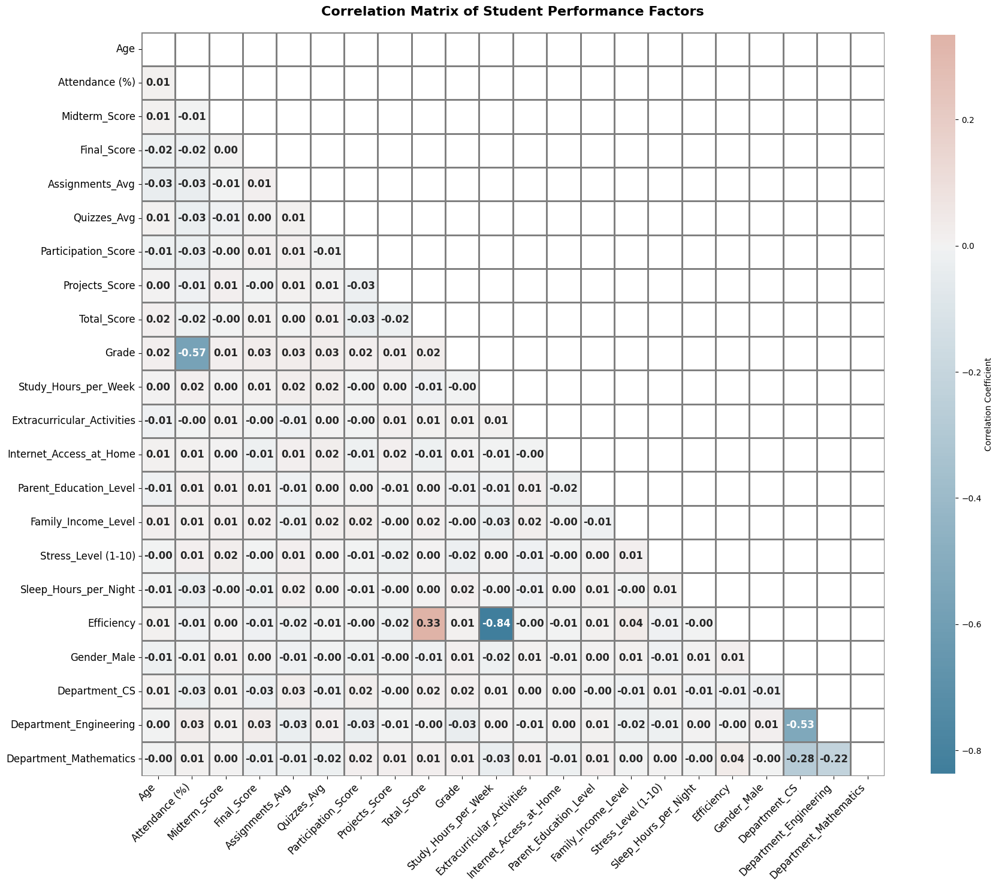

In [59]:
correlation_matrix = data.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(20, 20))

cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(
    correlation_matrix,
    mask=mask,
    cmap=cmap,
    annot=True,
    fmt=".2f",
    linewidths=1,
    linecolor="gray",
    cbar_kws={"shrink": 0.8, "aspect": 30, "label": "Correlation Coefficient"},
    center=0,
    square=True,
    annot_kws={"size": 12, "weight": "bold"}
)

plt.title("Correlation Matrix of Student Performance Factors", fontsize=16, weight="bold", pad=20)
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)

plt.show()


## Sleep_Hours_per_Night vs Attendance

In [60]:
from scipy.stats import pearsonr

corr, p_value = pearsonr(data["Sleep_Hours_per_Night"], data["Attendance (%)"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More sleep hours correlate with more Attendance.")
else:
    print("No significant correlation between sleep hours and attendence.")


Correlation: -0.03, P-value: 0.0148
Significant relationship found! More sleep hours correlate with more Attendance.


## Attendence vs Total Score

In [61]:
from scipy.stats import pearsonr #If you want to measure the strength & direction of a linear relationship

corr, p_value = pearsonr(data["Total_Score"], data["Attendance (%)"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More Total Score correlate with more Attendance.")
else:
    print("No significant correlation between Total Score and attendence.")


Correlation: -0.02, P-value: 0.1908
No significant correlation between Total Score and attendence.


In [62]:
median_attendance = data['Attendance (%)'].median()

low_attendance_scores = data.loc[data['Attendance (%)'] <= median_attendance, 'Total_Score']
high_attendance_scores = data.loc[data['Attendance (%)'] > median_attendance, 'Total_Score']

t_stat, p_value_t = stats.ttest_ind(low_attendance_scores, high_attendance_scores)

print(f"T-test result: t-statistic = {t_stat:.4f}, p-value = {p_value_t:.4f}")

T-test result: t-statistic = 1.7945, p-value = 0.0728


In [63]:
print(data['Attendance (%)'].mean(), data['Total_Score'].mean())
print(data['Attendance (%)'].std(), data['Total_Score'].std())

75.431409455843 75.121804
13.61048103548332 14.399941391825209


## parent education level vs student performance.

In [64]:
from scipy.stats import f_oneway

groups = [data[data["Parent_Education_Level"] == level]["Total_Score"] for level in data["Parent_Education_Level"].unique()]
anova_result = f_oneway(*groups)

print(f"ANOVA p-value: {anova_result.pvalue:.4f}")
if anova_result.pvalue < 0.05:
    print("Parent education level significantly affects student performance!")
else:
    print("No significant effect of parent education level on student performance.")


ANOVA p-value: 0.7722
No significant effect of parent education level on student performance.


## Attendance vs Grade

In [65]:
corr, p_value = pearsonr(data["Grade"], data["Attendance (%)"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More Grade correlate with more Attendance.")
else:
    print("No significant correlation between Grade and Attendance.")


Correlation: -0.57, P-value: 0.0000
Significant relationship found! More Grade correlate with more Attendance.


In [66]:
median_attendance = data['Attendance (%)'].median()

low_attendance_scores = data.loc[data['Attendance (%)'] <= median_attendance, 'Grade']
high_attendance_scores = data.loc[data['Attendance (%)'] > median_attendance, 'Grade']

t_stat, p_value_t = stats.ttest_ind(low_attendance_scores, high_attendance_scores)

print(f"T-test result: t-statistic = {t_stat:.4f}, p-value = {p_value_t:.4f}")

T-test result: t-statistic = 36.4434, p-value = 0.0000


High Attendance Doesn't Always Mean Better Grades

Some students may attend all classes but struggle with exams, assignments, or understanding the material.

## Study Hours vs. Total Score

In [67]:
corr, p_value = pearsonr(data["Total_Score"], data["Study_Hours_per_Week"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More Total Score correlate with more Study Hours.")
else:
    print("No significant correlation between Total Score and Study Hours.")


Correlation: -0.01, P-value: 0.3676
No significant correlation between Total Score and Study Hours.


t-test If you want to compare two groups and check if their mean scores differ

In [68]:
median_hours = data['Study_Hours_per_Week'].median()

low_study_scores = data.loc[data['Study_Hours_per_Week'] <= median_hours, 'Total_Score']
high_study_scores = data.loc[data['Study_Hours_per_Week'] > median_hours, 'Total_Score']

t_statistic, p_value = stats.ttest_ind(low_study_scores, high_study_scores)

print(f"T-test result: t-statistic = {t_statistic:.4f}, p-value = {p_value:.4f}")


T-test result: t-statistic = 1.3329, p-value = 0.1826


In [69]:
print(data['Study_Hours_per_Week'].mean(), data['Total_Score'].mean())
print(data['Study_Hours_per_Week'].std(), data['Total_Score'].std())

17.65886 75.121804
7.275864288222276 14.399941391825209


**there is no strong statistical evidence to suggest that study hours significantly impact total scores.**

## Stress Level vs. Total Score

In [70]:
corr, p_value = pearsonr(data["Total_Score"], data["Stress_Level (1-10)"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More Total Score correlate with more Stress Level.")
else:
    print("No significant correlation between Total Score and Stress Level.")


Correlation: 0.00, P-value: 0.7656
No significant correlation between Total Score and Stress Level.


In [71]:
median_hours = data['Stress_Level (1-10)'].median()

low_study_scores = data.loc[data['Stress_Level (1-10)'] <= median_hours, 'Total_Score']
high_study_scores = data.loc[data['Stress_Level (1-10)'] > median_hours, 'Total_Score']

t_statistic, p_value = stats.ttest_ind(low_study_scores, high_study_scores)

print(f"T-test result: t-statistic = {t_statistic:.4f}, p-value = {p_value:.4f}")


T-test result: t-statistic = 0.3320, p-value = 0.7399


In [72]:
print(data['Stress_Level (1-10)'].mean(), data['Total_Score'].mean())
print(data['Stress_Level (1-10)'].std(), data['Total_Score'].std())

5.4808 75.121804
2.8615501138038337 14.399941391825209


**no strong statistical evidence that stress level significantly impacts total scores.**

## Depatment math vs Effetiency

In [73]:
corr,p_value = pearsonr(data["Efficiency"], data["Department_Mathematics"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! Department Math correlate with Efficiency.")
else:
    print("No significant correlation between Department Math and Efficiency.")


Correlation: 0.04, P-value: 0.0108
Significant relationship found! Department Math correlate with Efficiency.


## Midterm score vs Final score

In [74]:
corr,p_value = pearsonr(data["Midterm_Score"], data["Final_Score"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More Midterm Score correlate with more Final Score.")
else:
    print("No significant correlation between Midterm Score and Final Score.")

Correlation: 0.00, P-value: 0.9526
No significant correlation between Midterm Score and Final Score.


## Family income level vs Effeciency

In [75]:
corr,p_value = pearsonr(data["Efficiency"], data["Family_Income_Level"])

print(f"Correlation: {corr:.2f}, P-value: {p_value:.4f}")

if p_value < 0.05:
    print("Significant relationship found! More Family Income Level correlate with more Efficiency.")
else:
    print("No significant correlation between Family Income Level and Efficiency.")

Correlation: 0.04, P-value: 0.0107
Significant relationship found! More Family Income Level correlate with more Efficiency.


In [76]:
median_eff = data['Efficiency'].median()

low_eff= data.loc[data['Efficiency'] <= median_hours, 'Family_Income_Level']
high_eff = data.loc[data['Efficiency'] > median_hours, 'Family_Income_Level']

t_statistic, p_value = stats.ttest_ind(low_eff, high_eff)

print(f"T-test result: t-statistic = {t_statistic:.4f}, p-value = {p_value:.4f}")

T-test result: t-statistic = -1.2300, p-value = 0.2188


**Higher Family Income is Associated with Higher Efficiency**

<h1 style="border-top: 3px solid purple; border-bottom: 3px solid purple; padding: 5px; text-align: center;">
    Recommendations
</h1>


* **Encouraging Participation:** Promoting classroom engagement through interactive learning.
* **Encourage Regular Attendance:** Monitor and improve attendance rates with engagement programs.
* **Address Stress and Sleep Deficiency:** Offer stress management programs and mental health support services.
* **For students aged 19-21:** Encourage better time management and stress management techniques.
* **Targeted Interventions:** Support for students with lower socio-economic backgrounds to bridge performance gaps.
* **Enhance Digital Learning Accessibility:** Ensure that all students have access to digital learning resources, especially at home.
* **Improve Study Techniques for Better Performance:** Since increased study hours do not necessarily translate to higher scores, students may need more effective study techniques.
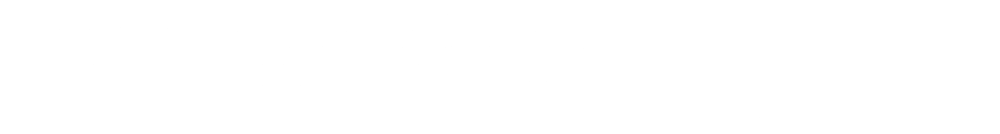
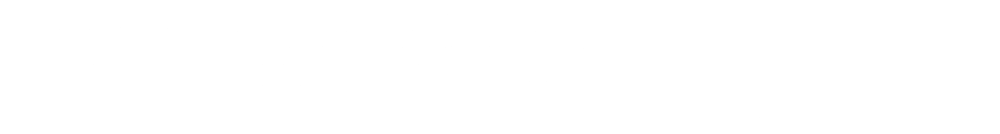
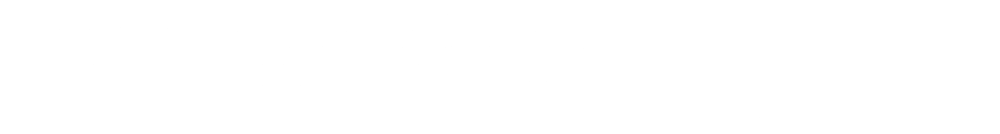
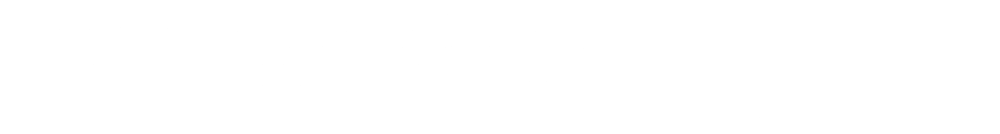